In [2]:
import matplotlib.pyplot as plt
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

import kktk

import matplotlib as mpl
# enables correct plotting of text
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42 

/rfs/project/rfs-iCNyzSAaucw/kk837/github/kktk/kktk/plotting.py:21: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('scanpy')` instead
  if sc.__version__.startswith("1.4"):


In [3]:
import session_info
session_info.show()

/home/kk837/.conda/envs/generic_env/lib/python3.10/site-packages/session_info/main.py:213: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('scanpy')` instead
  mod_version = _find_version(mod.__version__)
/home/kk837/.conda/envs/generic_env/lib/python3.10/site-packages/session_info/main.py:213: UserWarning: The '__version__' attribute is deprecated and will be removed in MarkupSafe 3.1. Use feature detection, or `importlib.metadata.version("markupsafe")`, instead.
  mod_version = _find_version(mod.__version__)


In [4]:
sc.settings.set_figure_params(dpi=80)

# Function

In [5]:
# https://cell2location.readthedocs.io/en/latest/notebooks/cell2location_short_demo.html
def select_slide(adata, s, s_col='sample'):
    r""" This function selects the data for one slide from the spatial anndata object.

    :param adata: Anndata object with multiple spatial experiments
    :param s: name of selected experiment
    :param s_col: column in adata.obs listing experiment name for each location
    """

    slide = adata[adata.obs[s_col].isin([s]), :]
    s_keys = list(slide.uns['spatial'].keys())
    s_spatial = np.array(s_keys)[[s in k for k in s_keys]][0]

    slide.uns['spatial'] = {s_spatial: slide.uns['spatial'][s_spatial]}

    return slide

# Variables

In [6]:
data_object_dir = '/rfs/project/rfs-iCNyzSAaucw/kk837/data_objects/Foetal/VisiumHD/Revision_Oct2025/TACCO/coarse_grain_subsets'
celltype = 'AtrialCardiomyocytes'
adata_path = f'{data_object_dir}/b2c_cells_{celltype}_lognorm.h5ad'

In [7]:
# figdir = '/nfs/team205/heart/fetal_ms_figures/raw_plots_kk/Aug2024'
# table_dir = '/nfs/team205/heart/fetal_ms_figures/tables/Aug2024'

# Read in data

In [8]:
# read in aCM annotated data
adata = sc.read_h5ad(adata_path)
print(adata.X.data[:5])
adata

[2.30024843 2.30024843 2.30024843 2.30024843 2.30024843]


AnnData object with n_obs × n_vars = 34193 × 17854
    obs: 'object_id', 'bin_count', 'array_row', 'array_col', 'labels_joint_source', 'in_tissue_manual', 'library', 'donor_section_ID', 'per-frame_donorIDs', 'donor', 'CS', 'est_CS', 'GA', 'PCW', 'section_ID', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'library_donor', 'n_genes', 'coarse_grain_pre', 'coarse_grain_pre_2', 'coarse_grain_tacco_ref-hd-scn', 'original_cellid_celltype', 'tacco_max_compscore', 'scVI_leiden_0.2', 'scVI_leiden_0.3', 'scVI_leiden_0.4', 'scVI_leiden_0.5', 'scVI_leiden_0.8', 'scVI_leiden_1.0', 'scVI_leiden_1.5', 'scVI_leiden_2.0', 'scVI_leiden_3.0', 'scVI_leiden_4.0', 'fine_grain', 'fine_grain2'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_m

# Subset SAN cells

In [9]:
import scanpy.external as sce

[<Axes: title={'center': 'SHOX2'}, xlabel='X_umap1', ylabel='X_umap2'>,
 <Axes: title={'center': 'VSNL1'}, xlabel='X_umap1', ylabel='X_umap2'>,
 <Axes: title={'center': 'TBX3'}, xlabel='X_umap1', ylabel='X_umap2'>,
 <Axes: title={'center': 'fine_grain'}, xlabel='X_umap1', ylabel='X_umap2'>]

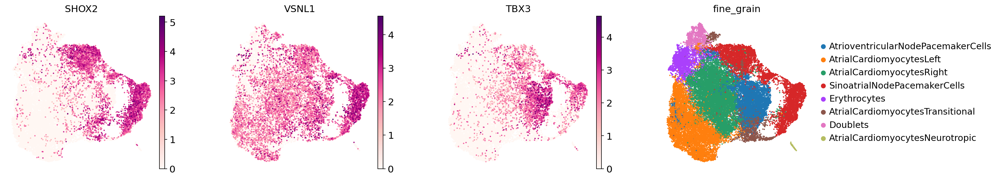

In [10]:
sc.pl.embedding(adata,basis='X_umap',
                color=['SHOX2','VSNL1','TBX3','fine_grain'],
                frameon=False, cmap='RdPu', size=15,
                wspace=0.3, show=False)
# plt.savefig(f'{figdir}/VisiumHD_euploid_atrialCM_UMAP.pdf', bbox_inches="tight",dpi=300)

In [12]:
san = adata[adata.obs['fine_grain']=='SinoatrialNodePacemakerCells']
san

View of AnnData object with n_obs × n_vars = 6272 × 17854
    obs: 'object_id', 'bin_count', 'array_row', 'array_col', 'labels_joint_source', 'in_tissue_manual', 'library', 'donor_section_ID', 'per-frame_donorIDs', 'donor', 'CS', 'est_CS', 'GA', 'PCW', 'section_ID', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'library_donor', 'n_genes', 'coarse_grain_pre', 'coarse_grain_pre_2', 'coarse_grain_tacco_ref-hd-scn', 'original_cellid_celltype', 'tacco_max_compscore', 'scVI_leiden_0.2', 'scVI_leiden_0.3', 'scVI_leiden_0.4', 'scVI_leiden_0.5', 'scVI_leiden_0.8', 'scVI_leiden_1.0', 'scVI_leiden_1.5', 'scVI_leiden_2.0', 'scVI_leiden_3.0', 'scVI_leiden_4.0', 'fine_grain', 'fine_grain2'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', '

/home/kk837/.conda/envs/generic_env/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:744: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns["hvg"] = {"flavor": flavor}
/home/kk837/.conda/envs/generic_env/lib/python3.10/site-packages/scanpy/preprocessing/_pca/__init__.py:226: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  mask_var_param, mask_var = _handle_mask_var(


number of hvgs: 4411


2026-02-08 10:03:10,223 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2026-02-08 10:03:12,424 - harmonypy - INFO - sklearn.KMeans initialization complete.
2026-02-08 10:03:12,443 - harmonypy - INFO - Iteration 1 of 10
2026-02-08 10:03:13,372 - harmonypy - INFO - Iteration 2 of 10
2026-02-08 10:03:14,296 - harmonypy - INFO - Converged after 2 iterations
/home/kk837/.conda/envs/generic_env/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


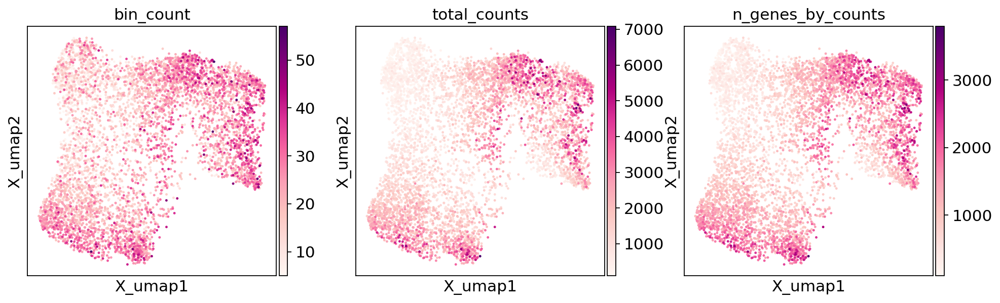

/tmp/ipykernel_1343485/2415057899.py:18: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(san,resolution=resolution,key_added=f'2nd-round_leiden_{str(resolution)}',n_iterations=2)


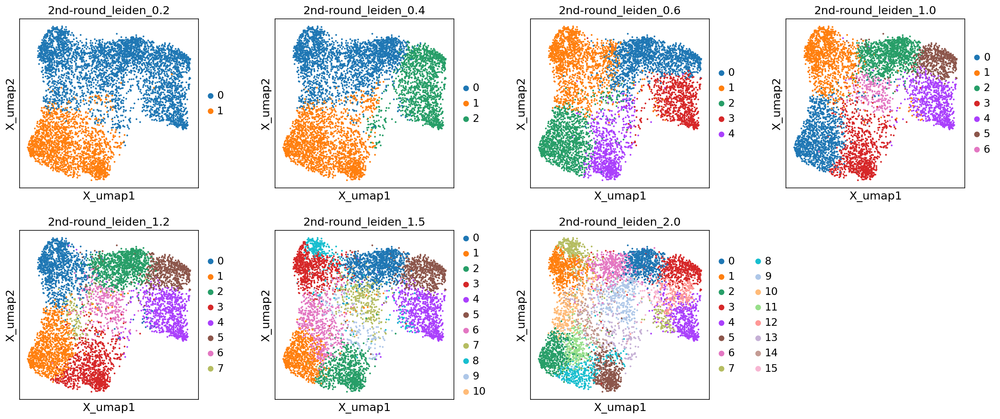

In [13]:
# HVGs, using the object which doesn't have midgrain markers
sc.pp.highly_variable_genes(san, flavor='seurat', min_mean=0.0125, max_mean=3, min_disp=0.5)
print(f'number of hvgs: {sum(san.var.highly_variable)}')
# PCA using the degected HVGs
sc.tl.pca(san, use_highly_variable=True)
# batch correction using harmony
sce.pp.harmony_integrate(san, "donor")
# create neighbour graph
sc.pp.neighbors(san,n_neighbors=15,use_rep='X_pca_harmony')
# visualisation with umap
sc.tl.umap(san,min_dist=0.1)
sc.pl.embedding(san,basis='X_umap',
                color=['bin_count','total_counts','n_genes_by_counts'],
                wspace=0.2,cmap='RdPu',vmax='p100',ncols=5)
# leiden clustering
resolutions_list = [0.2,0.4,0.6,1.0,1.2,1.5,2.0]
for resolution in resolutions_list:
    sc.tl.leiden(san,resolution=resolution,key_added=f'2nd-round_leiden_{str(resolution)}',n_iterations=2)
sc.pl.embedding(san,basis='X_umap',
                color=[f'2nd-round_leiden_{str(resolution)}' for resolution in resolutions_list],
                wspace=0.3)

# Remove low count clusters

In [14]:
resolution_sel = 2.0

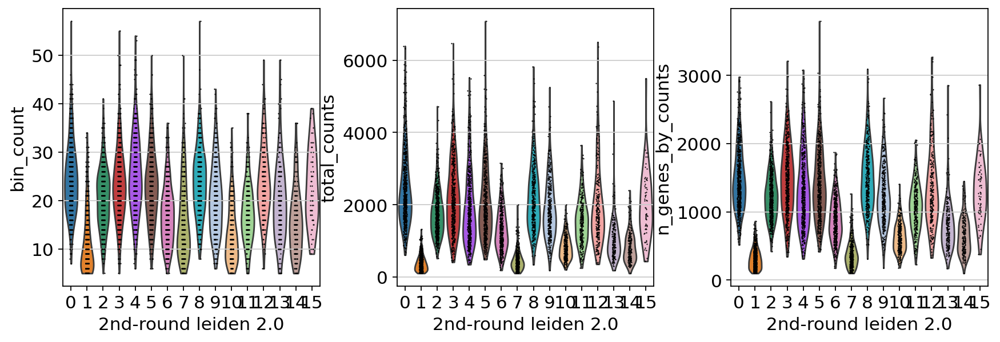

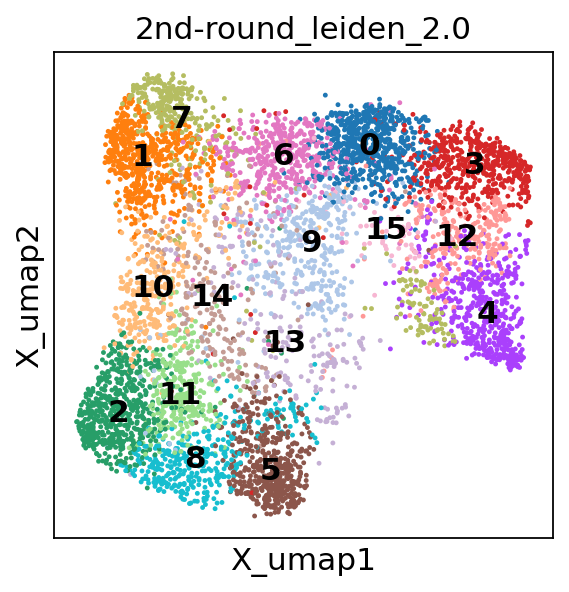

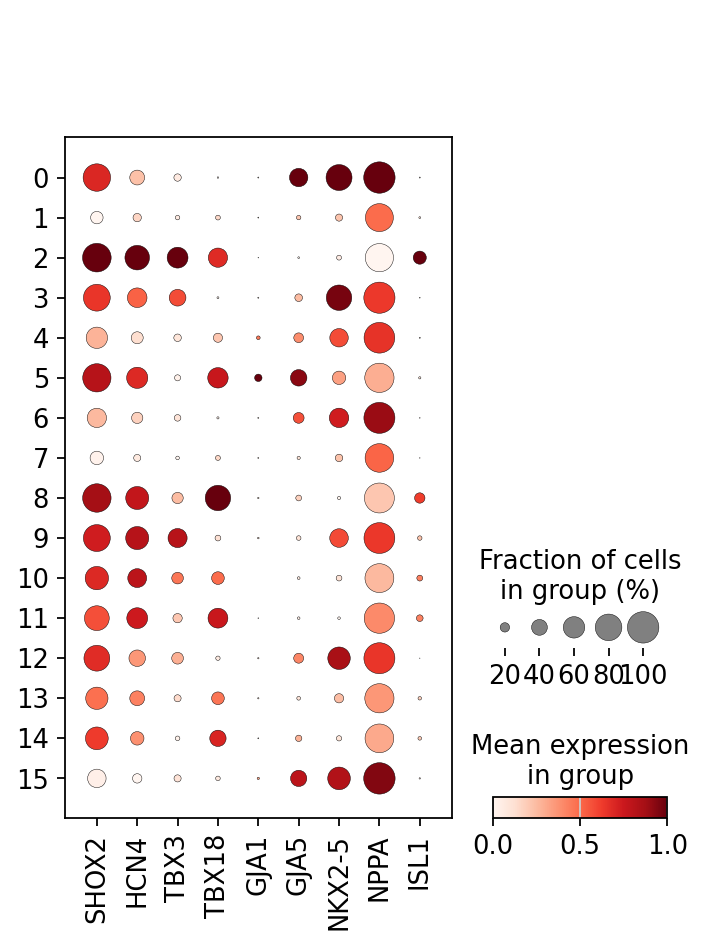

In [15]:
# total count per group
sc.pl.violin(san,keys=['bin_count','total_counts','n_genes_by_counts'],
             groupby=f'2nd-round_leiden_{str(resolution_sel)}')

sc.pl.embedding(san,basis='X_umap',
                color=f'2nd-round_leiden_{str(resolution_sel)}',
                legend_loc='on data')

genes = ['SHOX2','HCN4','TBX3','TBX18',
         'GJA1', # CX43
         'GJA5', # CX40
         'NKX2-5',
         'NPPA','ISL1'
        ]
genes = [x for x in genes if x in san.var_names]
sc.pl.dotplot(san,
              var_names=genes,
              groupby=f'2nd-round_leiden_{str(resolution_sel)}',
              standard_scale='var',
              dendrogram=False
             )

--> Remove cluster 1 and 7

In [16]:
san_sel = san[san.obs[f'2nd-round_leiden_{str(resolution_sel)}'].isin(['1','7'])==False]
san_sel.shape

(5285, 17854)

In [17]:
san_sel

View of AnnData object with n_obs × n_vars = 5285 × 17854
    obs: 'object_id', 'bin_count', 'array_row', 'array_col', 'labels_joint_source', 'in_tissue_manual', 'library', 'donor_section_ID', 'per-frame_donorIDs', 'donor', 'CS', 'est_CS', 'GA', 'PCW', 'section_ID', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'library_donor', 'n_genes', 'coarse_grain_pre', 'coarse_grain_pre_2', 'coarse_grain_tacco_ref-hd-scn', 'original_cellid_celltype', 'tacco_max_compscore', 'scVI_leiden_0.2', 'scVI_leiden_0.3', 'scVI_leiden_0.4', 'scVI_leiden_0.5', 'scVI_leiden_0.8', 'scVI_leiden_1.0', 'scVI_leiden_1.5', 'scVI_leiden_2.0', 'scVI_leiden_3.0', 'scVI_leiden_4.0', 'fine_grain', 'fine_grain2', '2nd-round_leiden_0.2', '2nd-round_leiden_0.4', '2nd-round_leiden_0.6', '2nd-round_leiden_

# Re, UMAP and clustering

/home/kk837/.conda/envs/generic_env/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:744: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns["hvg"] = {"flavor": flavor}
/home/kk837/.conda/envs/generic_env/lib/python3.10/site-packages/scanpy/preprocessing/_pca/__init__.py:226: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  mask_var_param, mask_var = _handle_mask_var(


number of hvgs: 3371


2026-02-08 10:04:04,582 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2026-02-08 10:04:06,670 - harmonypy - INFO - sklearn.KMeans initialization complete.
2026-02-08 10:04:06,758 - harmonypy - INFO - Iteration 1 of 10
2026-02-08 10:04:07,512 - harmonypy - INFO - Iteration 2 of 10
2026-02-08 10:04:08,251 - harmonypy - INFO - Converged after 2 iterations


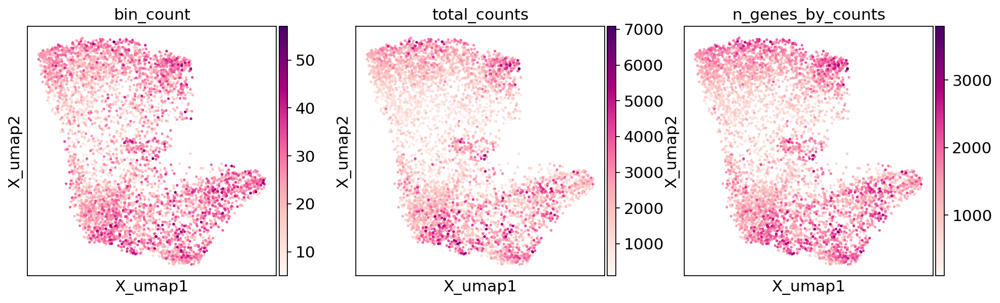

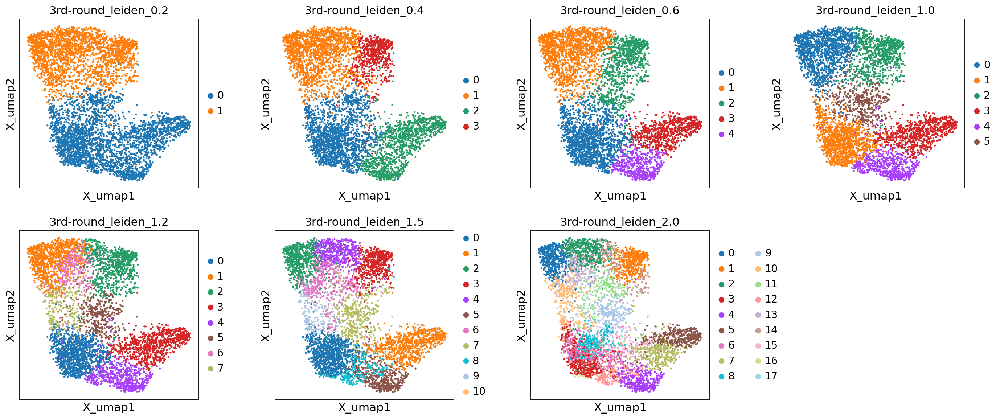

In [18]:
# HVGs, using the object which doesn't have midgrain markers
sc.pp.highly_variable_genes(san_sel, flavor='seurat', min_mean=0.0125, max_mean=3, min_disp=0.5)
print(f'number of hvgs: {sum(san_sel.var.highly_variable)}')
# PCA using the degected HVGs
sc.tl.pca(san_sel, use_highly_variable=True)
# batch correction using harmony
sce.pp.harmony_integrate(san_sel, "donor")
# create neighbour graph
sc.pp.neighbors(san_sel,n_neighbors=15,use_rep='X_pca_harmony')
# visualisation with umap
sc.tl.umap(san_sel,min_dist=0.1)
sc.pl.embedding(san_sel,basis='X_umap',
                color=['bin_count','total_counts','n_genes_by_counts'],
                wspace=0.2,cmap='RdPu',vmax='p100',ncols=5)
# leiden clustering
resolutions_list = [0.2,0.4,0.6,1.0,1.2,1.5,2.0]
for resolution in resolutions_list:
    sc.tl.leiden(san_sel,resolution=resolution,key_added=f'3rd-round_leiden_{str(resolution)}',n_iterations=2)
sc.pl.embedding(san_sel,basis='X_umap',
                color=[f'3rd-round_leiden_{str(resolution)}' for resolution in resolutions_list],
                wspace=0.3)

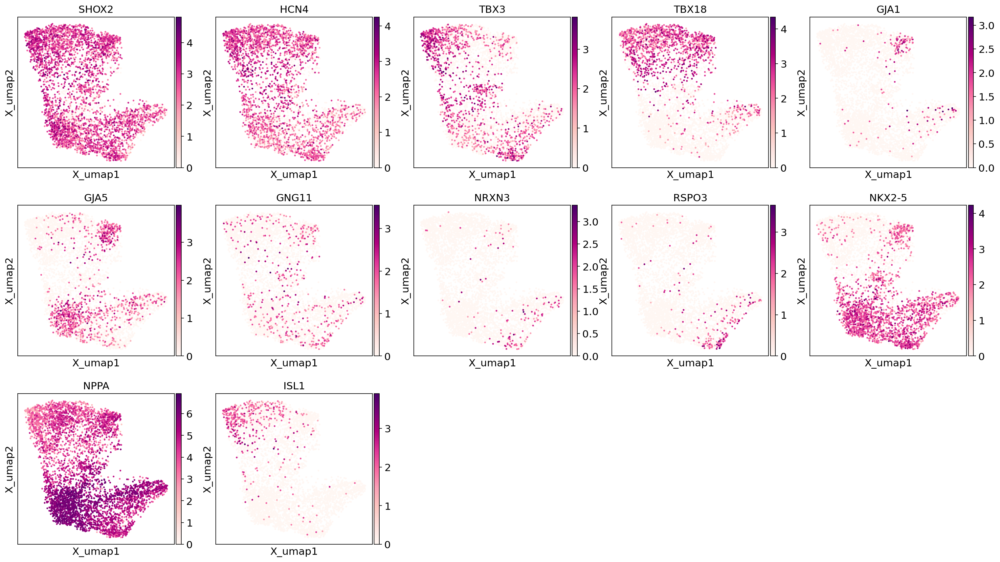

In [24]:
genes = ['SHOX2','HCN4','TBX3','TBX18',
         'GJA1', # CX43
         'GJA5', # CX40
         'GNG11','NRXN3','RSPO3', # AVNPC
         'NKX2-5',
         'NPPA','ISL1'
        ]
genes = [x for x in genes if x in san_sel.var_names]
sc.pl.embedding(san_sel,basis='X_umap',
                color=genes,
               ncols=5, wspace=0.15,cmap='RdPu',vmax='p100')

# Annotate

In [20]:
resolution_sel = 1.0

In [21]:
san_sel.obs[f'3rd-round_leiden_{str(resolution_sel)}'].value_counts()

3rd-round_leiden_1.0
0    1319
1    1198
2     863
3     823
4     636
5     446
Name: count, dtype: int64

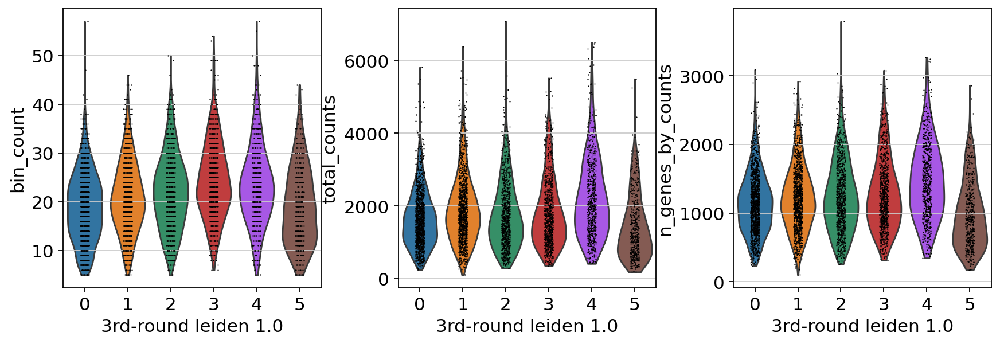

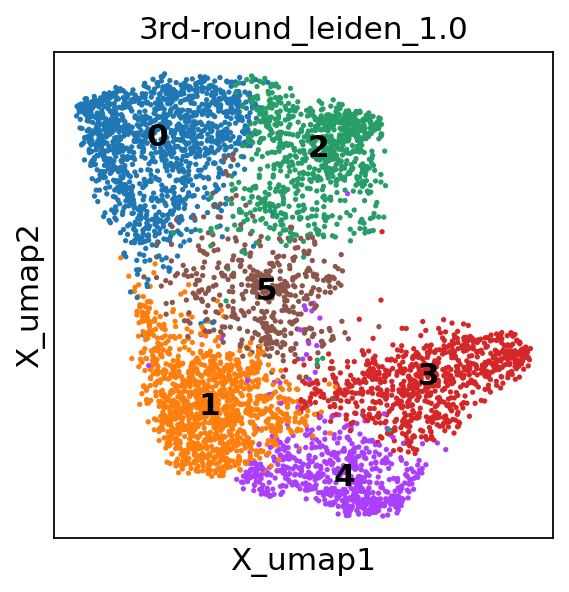

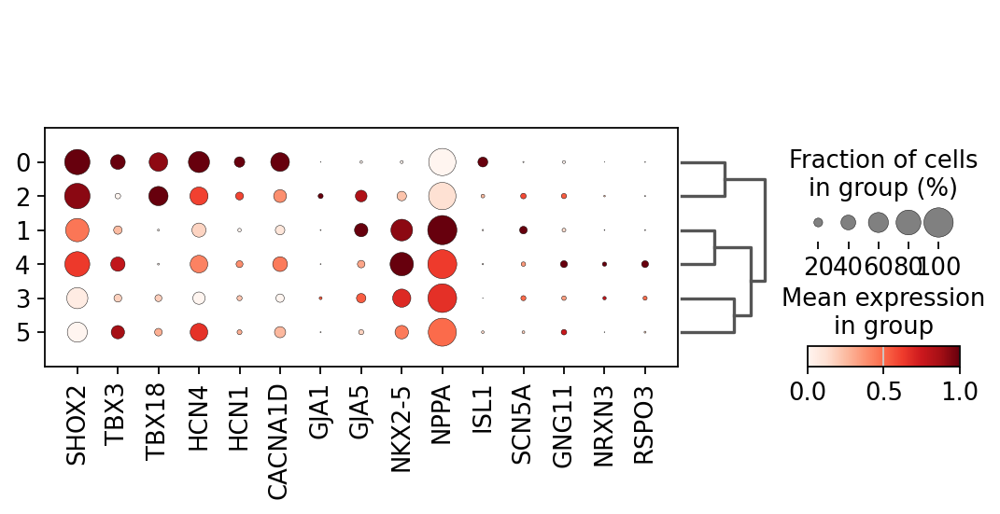

In [25]:
# total count per group
sc.pl.violin(san_sel,keys=['bin_count','total_counts','n_genes_by_counts'],
             groupby=f'3rd-round_leiden_{str(resolution_sel)}')

# plotting the clusters on UMAP
sc.pl.embedding(san_sel,basis='X_umap',
                color=f'3rd-round_leiden_{str(resolution_sel)}',
                legend_loc='on data')

# plotting the marker expressions
genes = ['SHOX2','TBX3','TBX18',
         'HCN4','HCN1','CACNA1D',
         'GJA1', # CX43
         'GJA5', # CX40
         'NKX2-5',
         'NPPA','ISL1',
         'SCN5A',
         'GNG11','NRXN3','RSPO3', # AVNPC
        ]
genes = [x for x in genes if x in san.var_names]
sc.pl.dotplot(san_sel,
              var_names=genes,
              groupby=f'3rd-round_leiden_{str(resolution_sel)}',
              standard_scale='var',
              dendrogram=True
             )

[2.22104167 2.22104167 2.22104167 2.22104167 2.22104167]


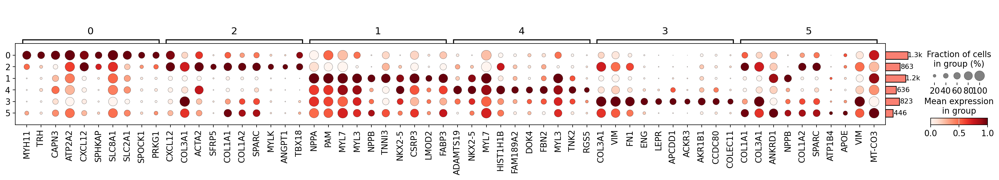

In [23]:
# DEG analysis
print(san_sel.X.data[:5])
san_sel.uns['log1p']['base']=None
sc.tl.rank_genes_groups(san_sel,groupby=f'3rd-round_leiden_{str(resolution_sel)}')
sc.tl.dendrogram(san_sel, groupby=f'3rd-round_leiden_{str(resolution_sel)}')
dp=sc.pl.rank_genes_groups_dotplot(san_sel, dendrogram=True, standard_scale='var', return_fig=True)
dp.add_totals().show()

categories: 0, 1, 2, etc.
var_group_labels: SANPC, AVNPC, aCM-left, etc.


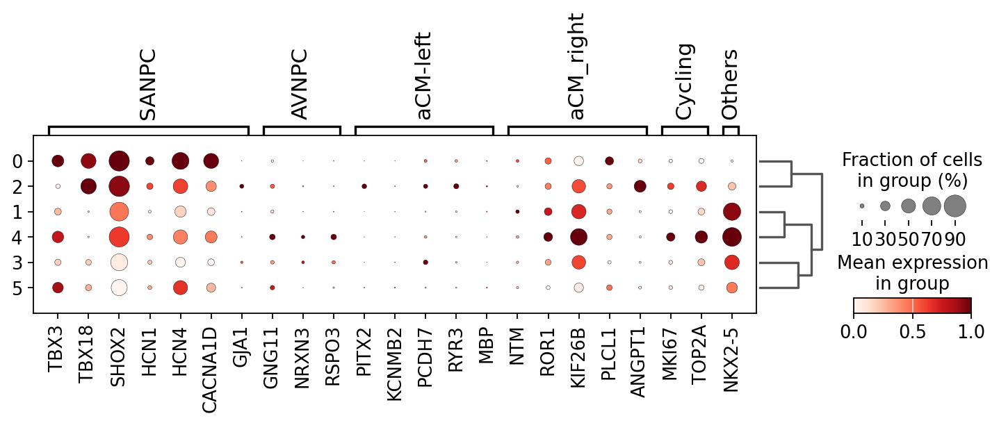

In [26]:
markers = {
    'SANPC': ['TBX3','TBX18','SHOX2','HCN1','HCN4','CACNA1D', 'GJA1'],
    'AVNPC':['GNG11','NRXN3','RSPO3'],
    'aCM-left':['PITX2','KCNMB2','PCDH7','RYR3','MBP'],
    'aCM_right':['NTM','ROR1','KIF26B','PLCL1','ANGPT1'],
    'Cycling':['MKI67','TOP2A'],
    'Others':['NKX2-5']
}

for key in markers.keys():
    markers[key]=[x for x in markers[key] if x in san_sel.var_names]

# sc.tl.dendrogram(adata,groupby=f'leiden_{str(resolution_sel)}')
sc.pl.dotplot(san_sel,
              var_names=markers,
              groupby=f'3rd-round_leiden_{str(resolution_sel)}',
              standard_scale='var',
              dendrogram=True
             )

In [27]:
san_sel.obs['fine_grain2'] = san_sel.obs[f'3rd-round_leiden_{str(resolution_sel)}'].copy()
san_sel.obs.replace({'fine_grain2':{
    '0':'SinoatrialNodePacemakerCellsHead',
    '1':'SinoatrialNodePacemakerCellsTail',
    '2':'SinusHornPacemakerCells',
    '3':'SinoatrialNodePacemakerCells_unclassified',
    '4':'AtrioventricularNodePacemakerCells',
    '5':'SinoatrialNodePacemakerCells_unclassified',
}},inplace=True)
san_sel.obs['fine_grain2'].value_counts()

/tmp/ipykernel_1343485/4273360286.py:2: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  san_sel.obs.replace({'fine_grain2':{


fine_grain2
SinoatrialNodePacemakerCellsHead             1319
SinoatrialNodePacemakerCells_unclassified    1269
SinoatrialNodePacemakerCellsTail             1198
SinusHornPacemakerCells                       863
AtrioventricularNodePacemakerCells            636
Name: count, dtype: int64

In [28]:
pd.crosstab(san_sel.obs['fine_grain2'],san_sel.obs['donor'])

donor,BRC2757,BRC2758,C194
fine_grain2,,,
SinoatrialNodePacemakerCellsHead,502,122,695
SinoatrialNodePacemakerCellsTail,383,346,469
SinusHornPacemakerCells,406,33,424
SinoatrialNodePacemakerCells_unclassified,395,366,508
AtrioventricularNodePacemakerCells,215,289,132


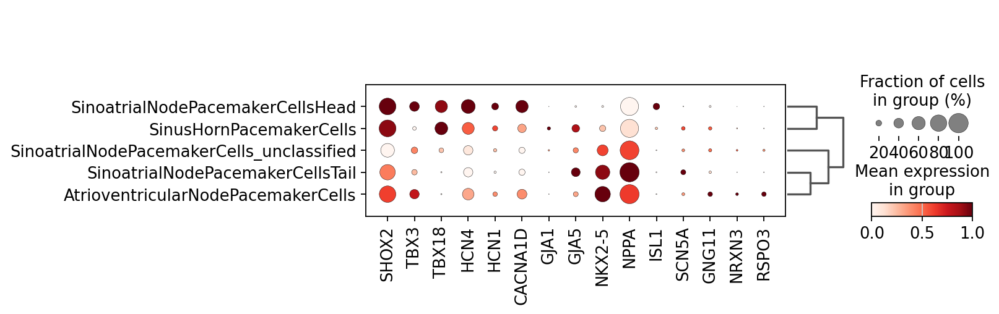

In [29]:
# plotting the marker expressions
genes = ['SHOX2','TBX3','TBX18',
         'HCN4','HCN1','CACNA1D',
         'GJA1', # CX43
         'GJA5', # CX40
         'NKX2-5',
         'NPPA','ISL1',
         'SCN5A',
         'GNG11','NRXN3','RSPO3', # AVNPC
        ]
genes = [x for x in genes if x in san.var_names]
sc.pl.dotplot(san_sel,
              var_names=genes,
              groupby='fine_grain2',
              standard_scale='var',
              dendrogram=True
             )

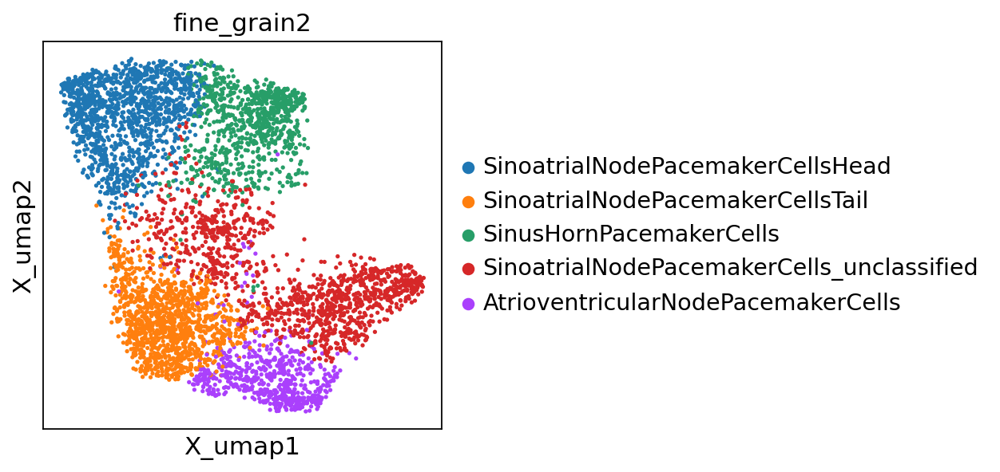

In [30]:
sc.pl.embedding(san_sel,basis='X_umap',
                color='fine_grain2',
                wspace=0.3)

# Add the labels to the original adata

In [31]:
low_count_cells = list(set(san.obs_names)-set(san_sel.obs_names))

In [33]:
adata.obs['fine_grain2'] = adata.obs['fine_grain'].astype('str').copy()
adata.obs.loc[low_count_cells,'fine_grain2'] = 'SinoatrialNodePacemakerCells_lowcounts'
adata.obs.loc[san_sel.obs_names,'fine_grain2'] = san_sel.obs['fine_grain2'].copy()
adata.obs['fine_grain2'].value_counts()

fine_grain2
AtrialCardiomyocytesRight                    9684
AtrialCardiomyocytesLeft                     8366
AtrioventricularNodePacemakerCells           5661
Erythrocytes                                 2130
AtrialCardiomyocytesTransitional             1604
SinoatrialNodePacemakerCellsHead             1319
SinoatrialNodePacemakerCells_unclassified    1269
SinoatrialNodePacemakerCellsTail             1198
Doublets                                      989
SinoatrialNodePacemakerCells_lowcounts        987
SinusHornPacemakerCells                       863
AtrialCardiomyocytesNeurotropic               123
Name: count, dtype: int64

# Save

In [34]:
adata.write(adata_path)
print(adata_path)

/rfs/project/rfs-iCNyzSAaucw/kk837/data_objects/Foetal/VisiumHD/Revision_Oct2025/TACCO/coarse_grain_subsets/b2c_cells_AtrialCardiomyocytes_lognorm.h5ad


In [35]:
san_sel.write(f'{data_object_dir}/b2c_cells_SinoatrialNodePacemakerCells_lognorm.h5ad')